In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

#class
from sklearn.inspection import permutation_importance
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import KFold, cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

#reg
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_percentage_error

from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor


In [2]:
def confusion_matrix_visualization(y_test, y_pred):

    plt.figure(figsize=(5,5))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="g")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")

In [3]:
def evaluate_classification(model, X_test, y_test):

    pred = model.predict(X_test)

    print("Acurácia: ", accuracy_score(y_test, pred))
    print("Recall: ", recall_score(y_test, pred))
    print("Precisão: ", precision_score(y_test, pred))
    print("F1-Score: ", f1_score(y_test, pred))

In [7]:
def safe_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero = y_true != 0
    return np.mean(np.abs((y_true[non_zero] - y_pred[non_zero]) / y_true[non_zero])) * 100


In [5]:
def evaluate_regression_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mape = safe_mape(y_test, y_pred)
    print(f"R² Score: {r2:.4f}, MAE: {mae:.4f}, MSE: {mse:.4f}, MAPE: {mape:.4f}, RMSE: {rmse:.4f}")


In [6]:
def feature_importance_regression(model, X_train):
    try:
        if 'AGE' in X_train.columns:
            X_train = X_train.drop(columns=['AGE'])

        if hasattr(model, 'coef_'):
            feature_importance = pd.Series(model.coef_, index=X_train.columns).sort_values(ascending=False)
            return feature_importance

        elif hasattr(model, 'feature_importances_'):
            feature_importance = pd.Series(model.feature_importances_, index=X_train.columns).sort_values(ascending=False)
            return feature_importance
        else:
            print("This model does not have feature importances or coefficients.")
            return None

    except AttributeError:
        print("Error: The provided model does not have feature_importances_ or coef_ attribute")
        return None

## AED | Preprocessing

In [8]:
df = pd.read_csv('./dataset/data_set.csv')
df.head(1)

,VDRL_RESULT,CONS_ALCOHOL,RH_FACTOR,SMOKER,PLAN_PREGNANCY,BLOOD_GROUP,HAS_PREG_RISK,TET_VACCINE,IS_HEAD_FAMILY,MARITAL_STATUS,...,HAS_FAM_INCOME,LEVEL_SCHOOLING,CONN_SEWER_NET,NUM_RES_HOUSEHOLD,HAS_FRU_TREE,HAS_VEG_GARDEN,FAM_INCOME,HOUSING_STATUS,WATER_TREATMENT,AGE
0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,...,0.0,5.0,0.0,2.0,1.0,1.0,0.0,1.0,2.0,25.0


In [16]:
na_values = df.isnull().sum()
print(na_values)

VDRL_RESULT          0
CONS_ALCOHOL         0
RH_FACTOR            0
SMOKER               0
PLAN_PREGNANCY       0
BLOOD_GROUP          0
HAS_PREG_RISK        0
TET_VACCINE          0
IS_HEAD_FAMILY       0
MARITAL_STATUS       0
FOOD_INSECURITY      0
NUM_ABORTIONS        0
NUM_LIV_CHILDREN     0
NUM_PREGNANCIES      0
FAM_PLANNING         0
TYPE_HOUSE           0
HAS_FAM_INCOME       0
LEVEL_SCHOOLING      0
CONN_SEWER_NET       0
NUM_RES_HOUSEHOLD    0
HAS_FRU_TREE         0
HAS_VEG_GARDEN       0
FAM_INCOME           0
HOUSING_STATUS       0
WATER_TREATMENT      0
AGE                  0
dtype: int64


In [17]:
total_negative = df[df['VDRL_RESULT'] == 1.0].shape[0]
print(total_negative)

40936


In [18]:
total_positive = df[df['VDRL_RESULT'] == 0.0].shape[0]

In [19]:
df_negative = df[df['VDRL_RESULT'] == 1.0]
df_positive = df[df['VDRL_RESULT'] == 0.0]

num_positive = len(df_positive)
num_negative = int(num_positive * (100 / 55))
df_negative_filtered = df_negative.sample(n=num_negative, random_state=42)

df_resampled = pd.concat([df_negative_filtered, df_positive], ignore_index=True)

df_resampled = df_resampled.sample(frac=1, random_state=42).reset_index(drop=True)

print("Original dataset shape:", df.shape)
print("Resampled dataset shape:", df_resampled.shape)


Original dataset shape: (41762, 26)
Resampled dataset shape: (2327, 26)


In [ ]:
df = df_resampled

In [21]:
df.describe()

,VDRL_RESULT,CONS_ALCOHOL,RH_FACTOR,SMOKER,PLAN_PREGNANCY,BLOOD_GROUP,HAS_PREG_RISK,TET_VACCINE,IS_HEAD_FAMILY,MARITAL_STATUS,...,HAS_FAM_INCOME,LEVEL_SCHOOLING,CONN_SEWER_NET,NUM_RES_HOUSEHOLD,HAS_FRU_TREE,HAS_VEG_GARDEN,FAM_INCOME,HOUSING_STATUS,WATER_TREATMENT,AGE
count,2327.000000,2327.000000,2327.000000,2327.000000,2327.000000,2327.000000,2327.000000,2327.000000,2327.000000,2327.000000,...,2327.000000,2327.000000,2327.000000,2327.000000,2327.000000,2327.000000,2327.000000,2327.000000,2327.000000,2327.000000
mean,0.645037,1.051998,0.756768,1.018049,0.668672,1.893425,0.894714,0.137946,0.952299,2.506661,...,0.245380,4.311130,0.501504,3.285346,0.998711,1.084229,1.193382,0.754190,1.921358,25.159433
std,0.478605,0.378205,0.946172,0.359876,0.560810,1.697144,0.425541,0.424284,0.518657,2.314451,...,0.430405,1.730653,0.630189,0.981017,0.580937,0.486928,1.218759,0.937743,1.162729,4.588007
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,...,0.000000,3.000000,0.000000,2.000000,1.000000,1.000000,0.000000,0.000000,2.000000,24.000000
50%,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,...,0.000000,5.000000,0.000000,3.000000,1.000000,1.000000,1.000000,0.000000,2.000000,25.000000
75%,1.000000,1.000000,2.000000,1.000000,1.000000,4.000000,1.000000,0.000000,1.000000,5.000000,...,0.000000,5.000000,1.000000,4.000000,1.000000,1.000000,3.000000,1.000000,2.000000,25.000000
max,1.000000,2.000000,2.000000,2.000000,2.000000,4.000000,2.000000,2.000000,2.000000,5.000000,...,1.000000,9.000000,2.000000,5.000000,2.000000,2.000000,3.000000,3.000000,4.000000,48.000000


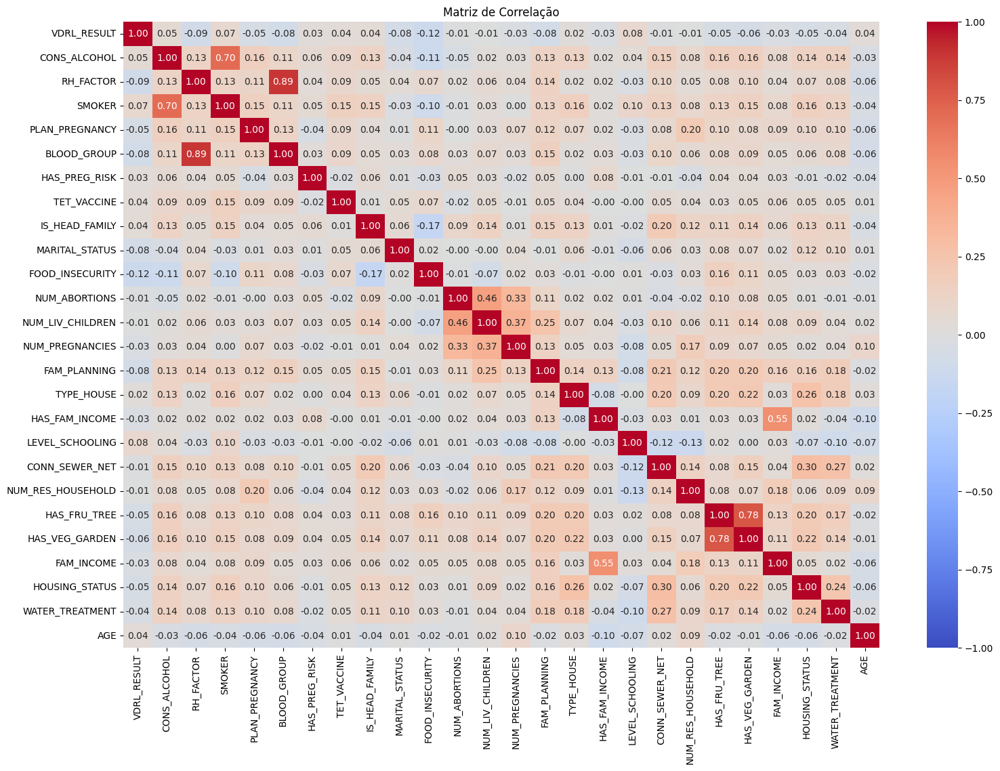

In [22]:
correlation_matrix = df.corr()
plt.figure(figsize=(18, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", vmax=1, vmin=-1)
plt.title('Matriz de Correlação')
plt.show()

In [23]:
df_negative = df[df['VDRL_RESULT'] == 1.0]
df_negative.shape

(1501, 26)

In [24]:
df_positive = df[df['VDRL_RESULT'] == 0.0]
df_positive.shape

(826, 26)

In [25]:
pd.crosstab(df['PLAN_PREGNANCY'], df['VDRL_RESULT'])

VDRL_RESULT,0.0,1.0
PLAN_PREGNANCY,,
0.0,274,605
1.0,521,819
2.0,31,77


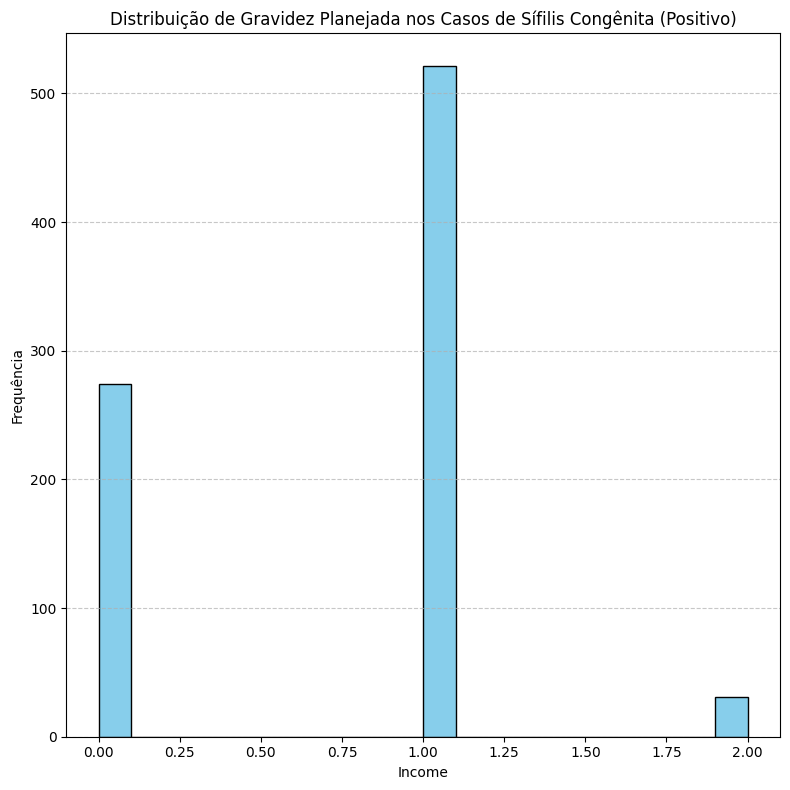

In [26]:
plt.figure(figsize=(8, 8))
plt.hist(df_positive['PLAN_PREGNANCY'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribuição de Gravidez Planejada nos Casos de Sífilis Congênita (Positivo)')
plt.xlabel('Income')
plt.ylabel('Frequência')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [27]:
pd.crosstab(df['LEVEL_SCHOOLING'], df['VDRL_RESULT'])


VDRL_RESULT,0.0,1.0
LEVEL_SCHOOLING,,
0.0,19,19
1.0,35,57
2.0,144,184
3.0,49,89
4.0,214,327
5.0,185,500
6.0,150,230
7.0,7,39
8.0,7,25


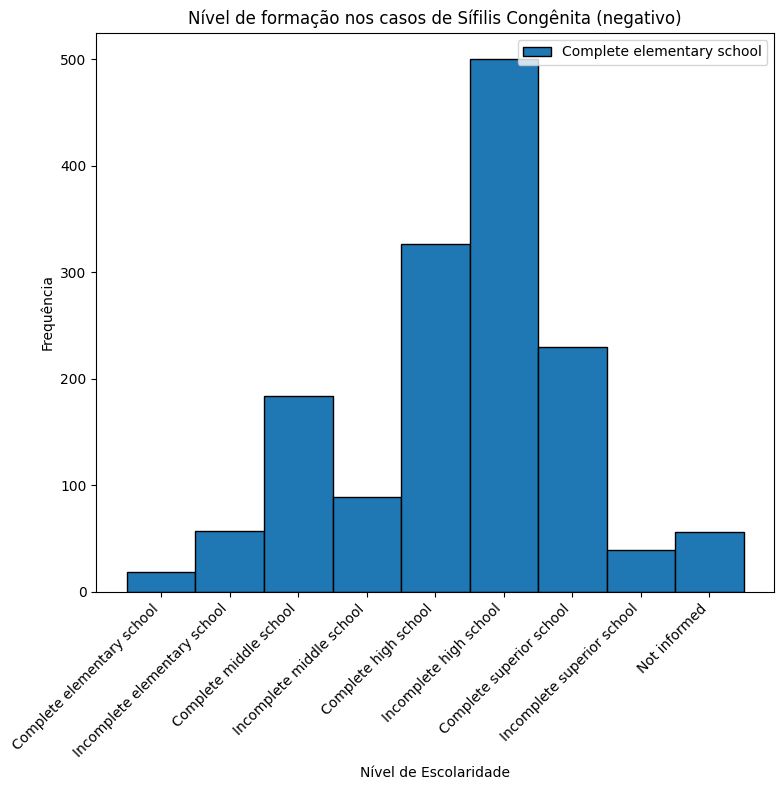

In [28]:
plt.figure(figsize=(8, 8))
plt.hist(df_negative['LEVEL_SCHOOLING'], bins=range(0, 10), edgecolor='black', align='left')
plt.title('Nível de formação nos casos de Sífilis Congênita (negativo)')
plt.xlabel('Nível de Escolaridade')
plt.ylabel('Frequência')
plt.xticks(ticks=range(0, 9), labels=[
    'Complete elementary school',
    'Incomplete elementary school',
    'Complete middle school',
    'Incomplete middle school',
    'Complete high school',
    'Incomplete high school',
    'Complete superior school',
    'Incomplete superior school',
    'Not informed'
], rotation=45, ha='right')
plt.legend(
    labels=[
        'Complete elementary school',
        'Incomplete elementary school',
        'Complete middle school',
        'Incomplete middle school',
        'Complete high school',
        'Incomplete high school',
        'Complete superior school',
        'Incomplete superior school',
        'Not informed'
    ],
    loc='upper right'
)
plt.tight_layout()
plt.show()


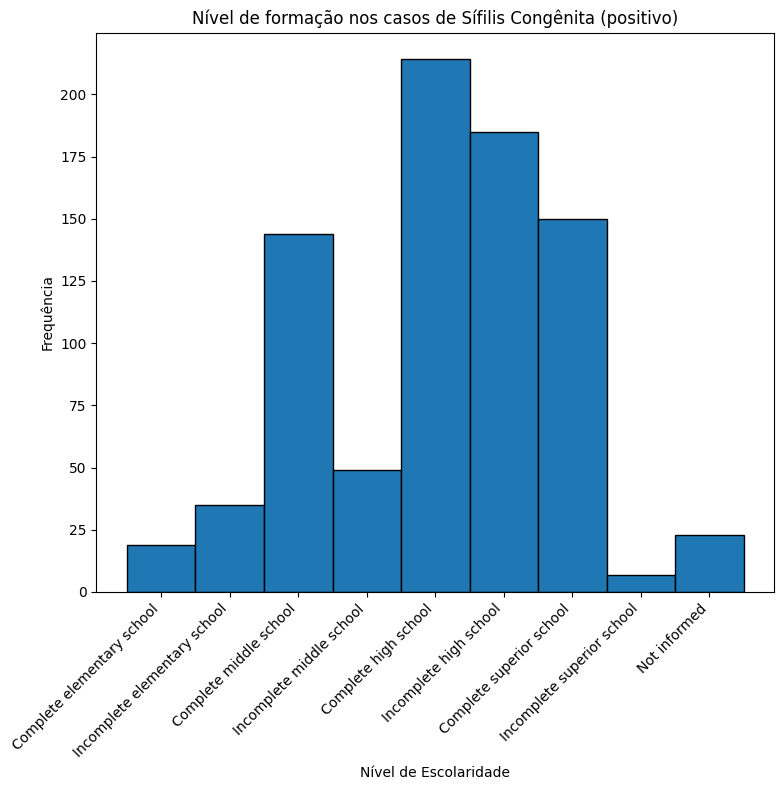

In [29]:
plt.figure(figsize=(8, 8))
plt.hist(df_positive['LEVEL_SCHOOLING'], bins=range(0, 10), edgecolor='black', align='left')
plt.title('Nível de formação nos casos de Sífilis Congênita (positivo)')
plt.xlabel('Nível de Escolaridade')
plt.ylabel('Frequência')
plt.xticks(ticks=range(0, 9), labels=[
    'Complete elementary school',
    'Incomplete elementary school',
    'Complete middle school',
    'Incomplete middle school',
    'Complete high school',
    'Incomplete high school',
    'Complete superior school',
    'Incomplete superior school',
    'Not informed'
], rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [30]:
# casos positivos com pessoas sem graduação
df_aux = df_positive[df_positive['LEVEL_SCHOOLING'] != 6]
df_aux.shape
# 826 - 676 = 150 --> ~ 18%

(676, 26)

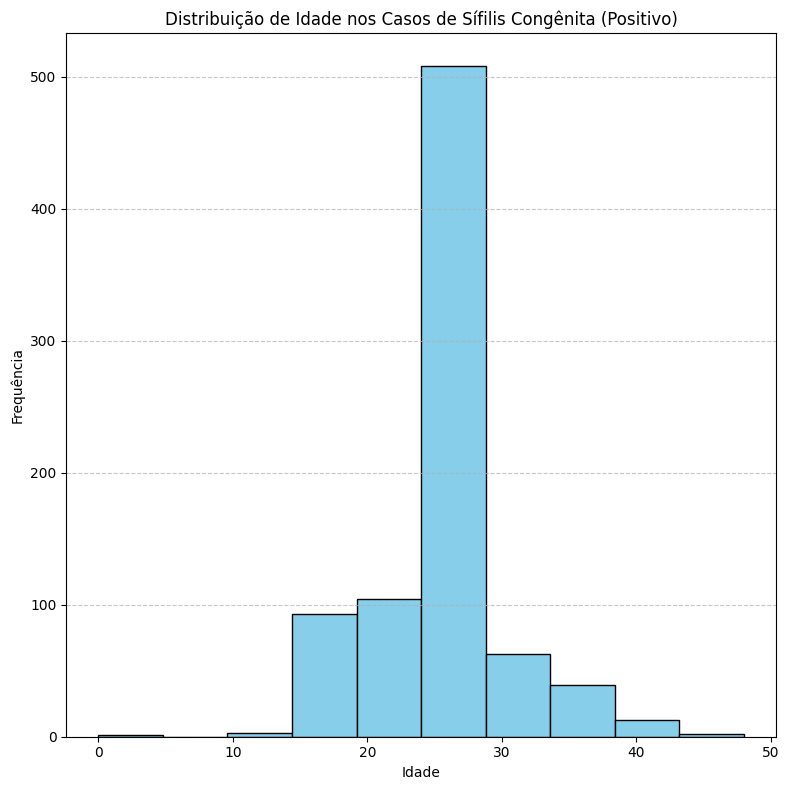

In [31]:
plt.figure(figsize=(8, 8))
plt.hist(df_positive['AGE'], bins=10, color='skyblue', edgecolor='black')
plt.title('Distribuição de Idade nos Casos de Sífilis Congênita (Positivo)')
plt.xlabel('Idade')
plt.ylabel('Frequência')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

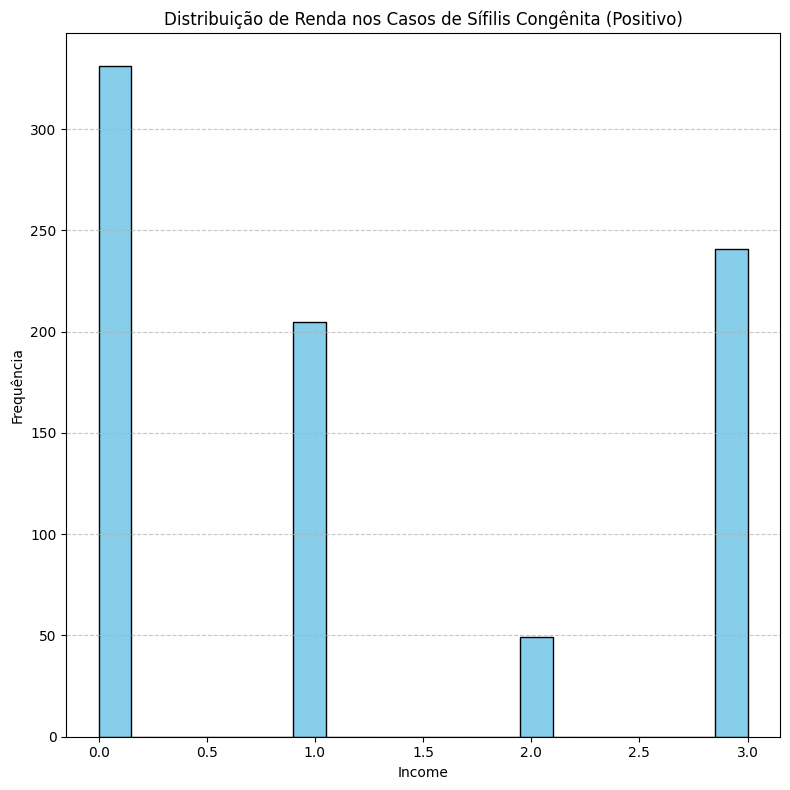

In [32]:
plt.figure(figsize=(8, 8))
plt.hist(df_positive['FAM_INCOME'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribuição de Renda nos Casos de Sífilis Congênita (Positivo)')
plt.xlabel('Income')
plt.ylabel('Frequência')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

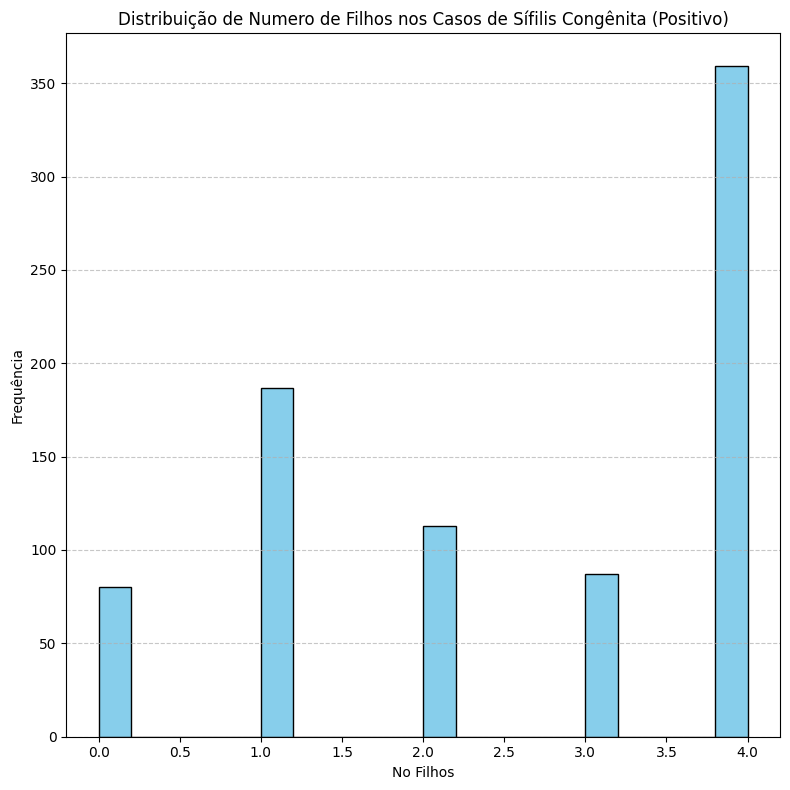

In [33]:
plt.figure(figsize=(8, 8))
plt.hist(df_positive['NUM_LIV_CHILDREN'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribuição de Numero de Filhos nos Casos de Sífilis Congênita (Positivo)')
plt.xlabel('No Filhos')
plt.ylabel('Frequência')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Classificação

In [61]:
X = df.drop('VDRL_RESULT', axis=1)
y = df['VDRL_RESULT']

smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

df_balanced = pd.DataFrame(X_resampled, columns=X.columns)
df_balanced['VDRL_RESULT'] = y_resampled

print(df_balanced['VDRL_RESULT'].value_counts())

VDRL_RESULT
1.0    40936
0.0    40936
Name: count, dtype: int64


In [62]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [63]:
knn = KNeighborsClassifier()

svc = SVC(random_state=42)

xgb = XGBClassifier(random_state=42)

In [64]:
# Definindo os hiperparâmetros para variação
n_neighbors_list_knn = [1, 2, 3, 4, 5, 9, 11]
weights_list_knn = ["uniform", "distance"]

C_list_svc = [0.1, 1, 10]
kernel_list_svc = ['linear', 'rbf']

trees_list_xgb = [50, 100, 200]
learning_rate_list_xgb = [0.01, 0.1, 0.2]

results = []

def train_knn_models(X_train, y_train, X_test, y_test):
    for n_neighbors in n_neighbors_list_knn:
        for weight in weights_list_knn:
            # Cria o modelo KNN com os parâmetros específicos
            knn = KNeighborsClassifier(n_neighbors=n_neighbors, weights=weight)

            # Treina o modelo
            knn.fit(X_train, y_train)

            # Faz previsões no conjunto de teste
            y_pred = knn.predict(X_test)

            # Calcula as métricas
            accuracy = accuracy_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred, average='weighted')
            precision = precision_score(y_test, y_pred, average='weighted')
            recall = recall_score(y_test, y_pred, average='weighted')

            # Armazena os resultados
            results.append({
                "n_neighbors": n_neighbors,
                "weights": weight,
                "accuracy": accuracy
            })

            print(f"neighbors={n_neighbors}, weights={weight} |"
                f"Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}")

    return results

def train_svc_models(X_train, y_train, X_test, y_test):
    for C in C_list_svc:
        for kernel in kernel_list_svc:
            # Cria o modelo SVC com os hiperparâmetros especificados
            svc = SVC(C=C, kernel=kernel, random_state=42)
            
            # Treina o modelo
            svc.fit(X_train, y_train)
            
            # Faz previsões no conjunto de teste
            y_pred = svc.predict(X_test)
            
            # Calcula as métricas
            accuracy = accuracy_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred, average='weighted')
            precision = precision_score(y_test, y_pred, average='weighted', zero_division=1)
            recall = recall_score(y_test, y_pred, average='weighted')
            
            # Armazena os resultados
            results.append({
                "model": "SVC",
                "C": C,
                "kernel": kernel,
                "accuracy": accuracy
            })
            
            print(f"C={C}, kernel={kernel} | Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}")

    return results

def train_xgb_models(X_train, y_train, X_test, y_test):
    for n_estimators in trees_list_xgb:
        for learning_rate in learning_rate_list_xgb:
            # Cria o modelo XGBClassifier com os hiperparâmetros especificados
            xgb = XGBClassifier(n_estimators=n_estimators, learning_rate=learning_rate, random_state=42)
            
            # Treina o modelo
            xgb.fit(X_train, y_train)
            
            # Faz previsões no conjunto de teste
            y_pred = xgb.predict(X_test)
            
            # Calcula as métricas
            accuracy = accuracy_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred, average='weighted')
            precision = precision_score(y_test, y_pred, average='weighted')
            recall = recall_score(y_test, y_pred, average='weighted')
            
            # Armazena os resultados
            results.append({
                "model": "XGBClassifier",
                "n_estimators": n_estimators,
                "learning_rate": learning_rate,
                "accuracy": accuracy
            })
            
            print(f"n_estimators={n_estimators}, learning_rate={learning_rate} | Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}")


In [65]:
results_knn = train_knn_models(X_train, y_train, X_test, y_test)

neighbors=1, weights=uniform |Accuracy: 0.9654, F1 Score: 0.9646, Precision: 0.9637, Recall: 0.9654
neighbors=1, weights=distance |Accuracy: 0.9654, F1 Score: 0.9646, Precision: 0.9637, Recall: 0.9654
neighbors=2, weights=uniform |Accuracy: 0.9474, F1 Score: 0.9553, Precision: 0.9636, Recall: 0.9474
neighbors=2, weights=distance |Accuracy: 0.9590, F1 Score: 0.9613, Precision: 0.9636, Recall: 0.9590
neighbors=3, weights=uniform |Accuracy: 0.9797, F1 Score: 0.9713, Precision: 0.9630, Recall: 0.9797
neighbors=3, weights=distance |Accuracy: 0.9795, F1 Score: 0.9713, Precision: 0.9638, Recall: 0.9795
neighbors=4, weights=uniform |Accuracy: 0.9784, F1 Score: 0.9706, Precision: 0.9629, Recall: 0.9784
neighbors=4, weights=distance |Accuracy: 0.9792, F1 Score: 0.9712, Precision: 0.9637, Recall: 0.9792
neighbors=5, weights=uniform |Accuracy: 0.9812, F1 Score: 0.9720, Precision: 0.9630, Recall: 0.9812
neighbors=5, weights=distance |Accuracy: 0.9810, F1 Score: 0.9721, Precision: 0.9662, Recall: 0.

/home/luisadolfo/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


neighbors=9, weights=uniform |Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9630, Recall: 0.9813
neighbors=9, weights=distance |Accuracy: 0.9812, F1 Score: 0.9721, Precision: 0.9677, Recall: 0.9812


/home/luisadolfo/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


neighbors=11, weights=uniform |Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9630, Recall: 0.9813
neighbors=11, weights=distance |Accuracy: 0.9812, F1 Score: 0.9721, Precision: 0.9677, Recall: 0.9812


#### neighbors = 5 | distance

In [66]:
results_svc = train_svc_models(X_train, y_train, X_test, y_test)

C=0.1, kernel=linear | Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9817, Recall: 0.9813
C=0.1, kernel=rbf | Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9817, Recall: 0.9813
C=1, kernel=linear | Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9817, Recall: 0.9813
C=1, kernel=rbf | Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9817, Recall: 0.9813
C=10, kernel=linear | Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9817, Recall: 0.9813
C=10, kernel=rbf | Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9817, Recall: 0.9813


In [67]:
results_xgb = train_xgb_models(X_train, y_train, X_test, y_test)

n_estimators=50, learning_rate=0.01 | Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9630, Recall: 0.9813
n_estimators=50, learning_rate=0.1 | Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9630, Recall: 0.9813


/home/luisadolfo/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/luisadolfo/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/luisadolfo/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


n_estimators=50, learning_rate=0.2 | Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9630, Recall: 0.9813
n_estimators=100, learning_rate=0.01 | Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9630, Recall: 0.9813


/home/luisadolfo/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/luisadolfo/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


n_estimators=100, learning_rate=0.1 | Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9630, Recall: 0.9813
n_estimators=100, learning_rate=0.2 | Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9630, Recall: 0.9813


/home/luisadolfo/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/luisadolfo/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


n_estimators=200, learning_rate=0.01 | Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9630, Recall: 0.9813


/home/luisadolfo/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


n_estimators=200, learning_rate=0.1 | Accuracy: 0.9813, F1 Score: 0.9721, Precision: 0.9630, Recall: 0.9813
n_estimators=200, learning_rate=0.2 | Accuracy: 0.9811, F1 Score: 0.9721, Precision: 0.9668, Recall: 0.9811


In [68]:
knn_best = KNeighborsClassifier(n_neighbors=5, weights="distance").fit(X_train, y_train)

xgb_best = XGBClassifier(n_estimators = 100, max_depth = 20, learning_rate = 0.1, random_state=42).fit(X_train, y_train)

svc_best = SVC(C=0.1, kernel='linear', random_state=42).fit(X_train, y_train)

### Avaliação dos modelos

Acurácia:  0.9810040705563093
Recall:  0.9995933306222041
Precisão:  0.9813942346083206
F1-Score:  0.9904101861552099


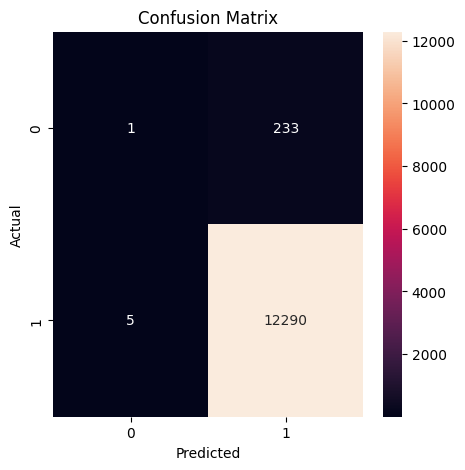

In [69]:
evaluate_classification(knn_best, X_test, y_test)
pred_knn = knn_best.predict(X_test)
confusion_matrix_visualization(y_test, pred_knn)

Acurácia:  0.9811637002155
Recall:  0.9997559983733225
Precisão:  0.9813972055888224
F1-Score:  0.990491539081386


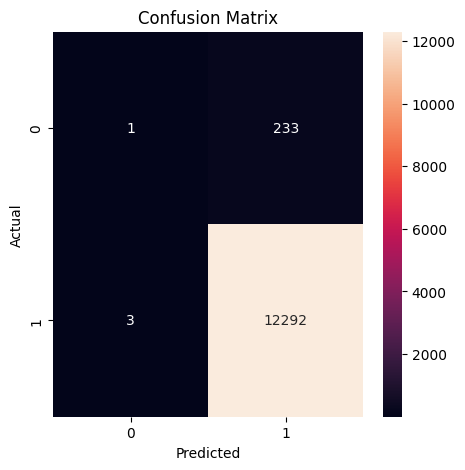

In [70]:
evaluate_classification(xgb_best, X_test, y_test)
pred_xgb = xgb_best.predict(X_test)
confusion_matrix_visualization(y_test, pred_xgb)

Acurácia:  0.9813233298746907
Recall:  1.0
Precisão:  0.9813233298746907
F1-Score:  0.9905736384144377


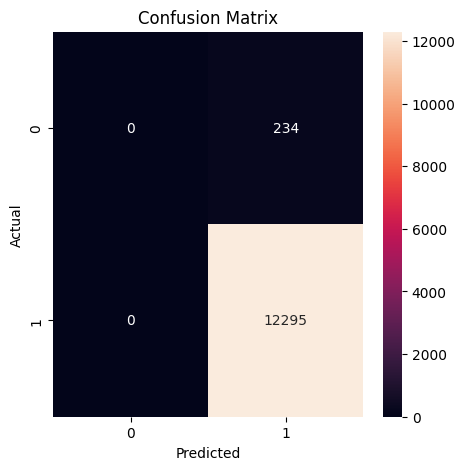

In [71]:
evaluate_classification(svc_best, X_test, y_test)
pred_svc = svc_best.predict(X_test)
confusion_matrix_visualization(y_test, pred_svc)

In [72]:
results = permutation_importance(knn_best, X_test, y_test, scoring='accuracy')

feature_imp_knn = pd.Series(results.importances_mean, index=X_train.columns).sort_values(ascending=False)
feature_imp_knn

PLAN_PREGNANCY       0.000144
HOUSING_STATUS       0.000144
FAM_PLANNING         0.000112
CONN_SEWER_NET       0.000048
SMOKER               0.000032
CONS_ALCOHOL         0.000032
HAS_PREG_RISK        0.000016
HAS_FAM_INCOME       0.000016
MARITAL_STATUS       0.000016
WATER_TREATMENT     -0.000016
FAM_INCOME          -0.000032
RH_FACTOR           -0.000048
TET_VACCINE         -0.000048
IS_HEAD_FAMILY      -0.000064
NUM_RES_HOUSEHOLD   -0.000064
HAS_VEG_GARDEN      -0.000080
FOOD_INSECURITY     -0.000080
NUM_LIV_CHILDREN    -0.000080
HAS_FRU_TREE        -0.000096
BLOOD_GROUP         -0.000112
TYPE_HOUSE          -0.000112
AGE                 -0.000144
LEVEL_SCHOOLING     -0.000160
NUM_PREGNANCIES     -0.000176
NUM_ABORTIONS       -0.000239
dtype: float64

In [73]:
feature_imp_xgb = pd.Series(xgb_best.feature_importances_, index=X_train.columns).sort_values(ascending=False)
feature_imp_xgb

SMOKER               0.059686
CONS_ALCOHOL         0.044875
HAS_FAM_INCOME       0.044036
TET_VACCINE          0.044023
WATER_TREATMENT      0.041328
HAS_PREG_RISK        0.041128
AGE                  0.040829
HAS_FRU_TREE         0.039693
TYPE_HOUSE           0.039472
IS_HEAD_FAMILY       0.039316
NUM_PREGNANCIES      0.039252
CONN_SEWER_NET       0.039120
NUM_LIV_CHILDREN     0.038969
HOUSING_STATUS       0.038863
FOOD_INSECURITY      0.038634
LEVEL_SCHOOLING      0.038332
PLAN_PREGNANCY       0.038251
NUM_ABORTIONS        0.038065
MARITAL_STATUS       0.037838
FAM_INCOME           0.037803
NUM_RES_HOUSEHOLD    0.037521
HAS_VEG_GARDEN       0.037295
FAM_PLANNING         0.036996
BLOOD_GROUP          0.036076
RH_FACTOR            0.032598
dtype: float32

In [74]:
coef = svc_best.coef_.flatten()

feature_imp_svc = pd.Series(np.abs(coef), index=X_train.columns).sort_values(ascending=False)
feature_imp_svc

HAS_VEG_GARDEN       0.000219
HAS_FRU_TREE         0.000164
SMOKER               0.000156
CONS_ALCOHOL         0.000105
TET_VACCINE          0.000103
NUM_ABORTIONS        0.000040
CONN_SEWER_NET       0.000034
WATER_TREATMENT      0.000025
HAS_FAM_INCOME       0.000025
HAS_PREG_RISK        0.000023
IS_HEAD_FAMILY       0.000023
HOUSING_STATUS       0.000020
FOOD_INSECURITY      0.000013
LEVEL_SCHOOLING      0.000013
FAM_PLANNING         0.000012
BLOOD_GROUP          0.000010
FAM_INCOME           0.000009
TYPE_HOUSE           0.000009
NUM_LIV_CHILDREN     0.000007
PLAN_PREGNANCY       0.000006
AGE                  0.000004
NUM_PREGNANCIES      0.000002
RH_FACTOR            0.000002
MARITAL_STATUS       0.000002
NUM_RES_HOUSEHOLD    0.000001
dtype: float64

In [75]:
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

In [76]:
# KNN
knn_scores = cross_val_score(knn_best, X, y, cv=kfold, scoring='accuracy')
print("KNN Cross-validation scores:", knn_scores)
print("KNN Average accuracy:", knn_scores.mean())

# Support Vector Classifier
svc_scores = cross_val_score(svc_best, X, y, cv=kfold, scoring='accuracy')
print("\nSuport Vector Classifier scores:", svc_scores)
print("Suport Vector Classifier accuracy:", svc_scores.mean())

# XGBoost
xgb_scores = cross_val_score(xgb_best, X, y, cv=kfold, scoring='accuracy')
print("\nXGBoost Cross-validation scores:", xgb_scores)
print("XGBoost Average accuracy:", xgb_scores.mean())

KNN Cross-validation scores: [0.98168323 0.97701425 0.98036398 0.98132184 0.97940613]
KNN Average accuracy: 0.9799578855968878

Suport Vector Classifier scores: [0.98204238 0.97749312 0.98072318 0.98132184 0.97952586]
Suport Vector Classifier accuracy: 0.9802212754909906

XGBoost Cross-validation scores: [0.98204238 0.97749312 0.98048372 0.98132184 0.97952586]
XGBoost Average accuracy: 0.9801733827706842


# Regressão


In [9]:
X = df.drop('VDRL_RESULT', axis=1)
y = df['VDRL_RESULT']

smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

df_balanced = pd.DataFrame(X_resampled, columns=X.columns)
df_balanced['VDRL_RESULT'] = y_resampled

print(df_balanced['VDRL_RESULT'].value_counts())

VDRL_RESULT
1.0    40936
0.0    40936
Name: count, dtype: int64


In [10]:
X_reg = df_balanced.drop(columns=["AGE"])
y_reg = df_balanced["AGE"]

In [11]:
X_reg_train, X_reg_test, y_reg_train, y_reg_test = train_test_split(X_reg, y_reg, test_size=0.3, random_state=42)

In [12]:
scaler = StandardScaler()

In [13]:
cols = X_reg.columns
X_reg_train = scaler.fit_transform(X_reg_train)
X_reg_train = pd.DataFrame(X_reg_train, columns=cols)

X_reg_test = scaler.fit_transform(X_reg_test)
X_reg_test = pd.DataFrame(X_reg_test, columns=cols)

In [14]:
knn_r = KNeighborsRegressor()

dt_r = DecisionTreeRegressor(random_state=42)

srv_r = SVR()

xgb_r = XGBRegressor(random_state=42)

In [15]:
n_neighbors_list_knn_r = [12, 13, 14, 15, 16]
max_depth_list_dt_r = [11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
n_estimators_list_xgb_r = [250, 275]
max_depth_list_xgb_r = [10, 12]
learning_rate_list_xgb_r = [0.01, 0.05, 0.07]
C_list_svr = [0.1, 1]
kernel_list_svr = ['linear', 'rbf']

weights_list_knn_r = ["uniform", "distance"]

regression_results_svr = []
regression_results_xgb_r = []
regression_results = []
regression_results_dt_r = []


def train_knn_regressor_models(X_train, y_train, X_test, y_test):
    regression_results = []
    
    for n_neighbors in n_neighbors_list_knn_r:
        for weight in weights_list_knn_r:
            knn_regressor = KNeighborsRegressor(n_neighbors=n_neighbors, weights=weight)

            knn_regressor.fit(X_train, y_train)

            y_pred = knn_regressor.predict(X_test)

            r2 = r2_score(y_test, y_pred)
            mae = mean_absolute_error(y_test, y_pred)
            mse = mean_squared_error(y_test, y_pred)
            mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
            rmse = np.sqrt(mse)

            regression_results.append({
                "n_neighbors": n_neighbors,
                "weights": weight,
                "r2_score": r2,
                "mae": mae,
                "mse": mse,
                "mape": mape,
                "rmse": rmse
            })

            print(f"Modelo com n_neighbors={n_neighbors}, weights={weight} | "
                f"R2 Score: {r2:.4f}, MAE: {mae:.4f}, MSE: {mse:.4f}, MAPE: {mape:.4f}, RMSE: {rmse:.4f}")

    return regression_results

def train_dt_regressor_models(X_train, y_train, X_test, y_test):
    for max_depth in max_depth_list_dt_r:
        dt_regressor = DecisionTreeRegressor(
            max_depth=max_depth,
            random_state=42
        )

        # Treina o modelo
        dt_regressor.fit(X_train, y_train)

        y_pred = dt_regressor.predict(X_test)

        r2 = r2_score(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)

        mape = safe_mape(y_test, y_pred)

        regression_results_dt_r.append({
            "max_depth": max_depth,
            "r2_score": r2,
            "mae": mae,
            "mse": mse,
            "mape": mape,
            "rmse": rmse
        })

        print(f"Modelo com max_depth={max_depth} -> "
            f"R2 Score: {r2:.4f}, MAE: {mae:.4f}, MSE: {mse:.4f}, MAPE: {mape:.4f}, RMSE: {rmse:.4f}")

    return regression_results_dt_r

def train_xgb_regressor_models(X_train, y_train, X_test, y_test):
    regression_results_xgb_r = []
    
    for n_estimators in n_estimators_list_xgb_r:
        for max_depth in max_depth_list_xgb_r:
            for learning_rate in learning_rate_list_xgb_r:
                xgb_regressor = XGBRegressor(
                    n_estimators=n_estimators,
                    max_depth=max_depth,
                    learning_rate=learning_rate,
                    random_state=42
                )

                xgb_regressor.fit(
                    X_train,
                    y_train,
                    eval_set=[(X_test, y_test)],
                    verbose=False
                )
                y_pred = xgb_regressor.predict(X_test)

                r2 = r2_score(y_test, y_pred)
                mae = mean_absolute_error(y_test, y_pred)
                mse = mean_squared_error(y_test, y_pred)
                rmse = np.sqrt(mse)
                mape = safe_mape(y_test, y_pred)

                regression_results_xgb_r.append({
                    "n_estimators": n_estimators,
                    "max_depth": max_depth,
                    "learning_rate": learning_rate,
                    "r2_score": r2,
                    "mae": mae,
                    "mse": mse,
                    "mape": mape,
                    "rmse": rmse
                })

                print(f"Modelo com n_estimators={n_estimators}, max_depth={max_depth}, learning_rate={learning_rate} -> "
                    f"R2 Score: {r2:.4f}, MAE: {mae:.4f}, MSE: {mse:.4f}, MAPE: {mape:.4f}, RMSE: {rmse:.4f}")

    return regression_results_xgb_r

def train_svr_regressor_models(X_train, y_train, X_test, y_test):
    for C in C_list_svr:
        for kernel in kernel_list_svr:
            svr_regressor = SVR(
                C=C,
                kernel=kernel
            )

            svr_regressor.fit(X_train, y_train)
            y_pred = svr_regressor.predict(X_test)

            r2 = r2_score(y_test, y_pred)
            mae = mean_absolute_error(y_test, y_pred)
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)
            mape = safe_mape(y_test, y_pred)

            regression_results_svr.append({
                "C": C,
                "kernel": kernel,
                "r2_score": r2,
                "mae": mae,
                "mse": mse,
                "mape": mape,
                "rmse": rmse
            })

            print(f"Modelo com C={C}, kernel={kernel} -> "
                f"R2 Score: {r2:.4f}, MAE: {mae:.4f}, MSE: {mse:.4f}, MAPE: {mape:.4f}, RMSE: {rmse:.4f}")

    return regression_results_svr

In [16]:
results_knn_r = train_knn_regressor_models(X_reg_train, y_reg_train, X_reg_test, y_reg_test)

Modelo com n_neighbors=12, weights=uniform | R2 Score: 0.5156, MAE: 1.5760, MSE: 9.9714, MAPE: inf, RMSE: 3.1577
Modelo com n_neighbors=12, weights=distance | R2 Score: 0.5335, MAE: 1.5147, MSE: 9.6032, MAPE: inf, RMSE: 3.0989
Modelo com n_neighbors=13, weights=uniform | R2 Score: 0.5175, MAE: 1.5729, MSE: 9.9322, MAPE: inf, RMSE: 3.1515
Modelo com n_neighbors=13, weights=distance | R2 Score: 0.5357, MAE: 1.5107, MSE: 9.5588, MAPE: inf, RMSE: 3.0917
Modelo com n_neighbors=14, weights=uniform | R2 Score: 0.5164, MAE: 1.5741, MSE: 9.9550, MAPE: inf, RMSE: 3.1552
Modelo com n_neighbors=14, weights=distance | R2 Score: 0.5357, MAE: 1.5095, MSE: 9.5584, MAPE: inf, RMSE: 3.0917
Modelo com n_neighbors=15, weights=uniform | R2 Score: 0.5163, MAE: 1.5750, MSE: 9.9576, MAPE: inf, RMSE: 3.1556
Modelo com n_neighbors=15, weights=distance | R2 Score: 0.5357, MAE: 1.5093, MSE: 9.5575, MAPE: inf, RMSE: 3.0915
Modelo com n_neighbors=16, weights=uniform | R2 Score: 0.5157, MAE: 1.5742, MSE: 9.9706, MAP

In [17]:
results_dt_r = train_dt_regressor_models(X_reg_train, y_reg_train, X_reg_test, y_reg_test)

Modelo com max_depth=11 -> R2 Score: 0.0410, MAE: 2.8122, MSE: 19.7416, MAPE: 37.0576, RMSE: 4.4432
Modelo com max_depth=12 -> R2 Score: -0.0290, MAE: 2.8659, MSE: 21.1820, MAPE: 36.2432, RMSE: 4.6024
Modelo com max_depth=13 -> R2 Score: -0.0726, MAE: 2.8637, MSE: 22.0799, MAPE: 12.1624, RMSE: 4.6989
Modelo com max_depth=14 -> R2 Score: -0.1729, MAE: 2.8979, MSE: 24.1446, MAPE: 12.3068, RMSE: 4.9137
Modelo com max_depth=15 -> R2 Score: -0.1879, MAE: 2.9335, MSE: 24.4528, MAPE: 12.4201, RMSE: 4.9450
Modelo com max_depth=16 -> R2 Score: -0.2469, MAE: 2.9716, MSE: 25.6690, MAPE: 12.5636, RMSE: 5.0665
Modelo com max_depth=17 -> R2 Score: -0.3098, MAE: 3.0081, MSE: 26.9621, MAPE: 12.7322, RMSE: 5.1925
Modelo com max_depth=18 -> R2 Score: -0.3708, MAE: 3.1098, MSE: 28.2177, MAPE: 13.1018, RMSE: 5.3120
Modelo com max_depth=19 -> R2 Score: -0.3789, MAE: 3.1074, MSE: 28.3862, MAPE: 13.1056, RMSE: 5.3279
Modelo com max_depth=20 -> R2 Score: -0.3972, MAE: 3.1190, MSE: 28.7630, MAPE: 13.1624, RMSE

In [18]:
results_svr_r = train_svr_regressor_models(X_reg_train, y_reg_train, X_reg_test, y_reg_test)

Modelo com C=0.1, kernel=linear -> R2 Score: 0.0052, MAE: 2.6120, MSE: 20.4793, MAPE: 37.8116, RMSE: 4.5254
Modelo com C=0.1, kernel=rbf -> R2 Score: 0.1315, MAE: 2.4340, MSE: 17.8779, MAPE: 35.6561, RMSE: 4.2282
Modelo com C=1, kernel=linear -> R2 Score: 0.0052, MAE: 2.6120, MSE: 20.4795, MAPE: 37.8114, RMSE: 4.5254
Modelo com C=1, kernel=rbf -> R2 Score: 0.3696, MAE: 1.9767, MSE: 12.9761, MAPE: 26.4923, RMSE: 3.6022


In [19]:
results_xgb_r = train_xgb_regressor_models(X_reg_train, y_reg_train, X_reg_test, y_reg_test)

Modelo com n_estimators=250, max_depth=10, learning_rate=0.01 -> R2 Score: 0.2144, MAE: 2.7727, MSE: 16.1714, MAPE: 26.9225, RMSE: 4.0214
Modelo com n_estimators=250, max_depth=10, learning_rate=0.05 -> R2 Score: 0.2282, MAE: 2.8104, MSE: 15.8872, MAPE: 22.1559, RMSE: 3.9859
Modelo com n_estimators=250, max_depth=10, learning_rate=0.07 -> R2 Score: 0.2329, MAE: 2.7645, MSE: 15.7915, MAPE: 22.7183, RMSE: 3.9739
Modelo com n_estimators=250, max_depth=12, learning_rate=0.01 -> R2 Score: 0.1870, MAE: 2.7860, MSE: 16.7364, MAPE: 30.6224, RMSE: 4.0910
Modelo com n_estimators=250, max_depth=12, learning_rate=0.05 -> R2 Score: 0.1468, MAE: 2.8382, MSE: 17.5628, MAPE: 29.7849, RMSE: 4.1908
Modelo com n_estimators=250, max_depth=12, learning_rate=0.07 -> R2 Score: 0.1487, MAE: 2.8857, MSE: 17.5254, MAPE: 29.5699, RMSE: 4.1863
Modelo com n_estimators=275, max_depth=10, learning_rate=0.01 -> R2 Score: 0.2142, MAE: 2.7792, MSE: 16.1752, MAPE: 26.8840, RMSE: 4.0218
Modelo com n_estimators=275, max_d

In [22]:
knn_r_best = KNeighborsRegressor(n_neighbors=15 , weights="distance").fit(X_reg_train, y_reg_train)

dt_r_best = DecisionTreeRegressor(max_depth=12, random_state=42).fit(X_reg_train, y_reg_train)

xgb_r_best = XGBRegressor(n_estimators=250, max_depth=10 , learning_rate=0.05, random_state=42).fit(X_reg_train, y_reg_train)

svr_r_best = SVR(C=1, kernel='rbf').fit(X_reg_train, y_reg_train)

In [23]:
prev_knn_r = knn_r_best.predict(X_reg_test)
evaluate_regression_model(knn_r_best, X_reg_test, y_reg_test)
fig = px.scatter(x=y_reg_test, y=prev_knn_r, title="KNN Regressor -Real x Previsto", trendline="ols",trendline_color_override="red", labels={"x":"Real", "y":"Previsto"})
fig.show()

R² Score: 0.5357, MAE: 1.5093, MSE: 9.5575, MAPE: 7.3731, RMSE: 3.0915


In [24]:
prev_dt_r = dt_r_best.predict(X_reg_test)
evaluate_regression_model(dt_r_best, X_reg_test, y_reg_test)
fig = px.scatter(x=y_reg_test, y=prev_dt_r, title="Decision Tree Regressor -Real x Previsto", trendline="ols",trendline_color_override="red", labels={"x":"Real", "y":"Previsto"})
fig.show()

R² Score: -0.0290, MAE: 2.8659, MSE: 21.1820, MAPE: 36.2432, RMSE: 4.6024


In [25]:
prev_xgb_r = xgb_r_best.predict(X_reg_test)
evaluate_regression_model(xgb_r_best, X_reg_test, y_reg_test)
fig = px.scatter(x=y_reg_test, y=prev_xgb_r, title="XGboost Regressor - Real x Previsto", trendline="ols",trendline_color_override="red", labels={"x":"Real", "y":"Previsto"})
fig.show()

R² Score: 0.2282, MAE: 2.8104, MSE: 15.8872, MAPE: 22.1559, RMSE: 3.9859


In [26]:
prev_svr_r = svr_r_best.predict(X_reg_test)
evaluate_regression_model(svr_r_best, X_reg_test, y_reg_test)
fig = px.scatter(x=y_reg_test, y=prev_svr_r, title="Support Vector Regressor - Real x Previsto", trendline="ols",trendline_color_override="red", labels={"x":"Real", "y":"Previsto"})
fig.show()

R² Score: 0.3696, MAE: 1.9767, MSE: 12.9761, MAPE: 26.4923, RMSE: 3.6022


In [27]:
feature_imp_knn_r = feature_importance_regression(knn_r_best, X_reg_train)
print("\nKNN Regressor Feature Importances:")
print(feature_imp_knn_r)

feature_imp_svr_r = feature_importance_regression(svr_r_best, X_reg_train)
print("\nRandom Forest Regressor Feature Importances:")
print(feature_imp_svr_r)

feature_imp_dt_r = feature_importance_regression(dt_r_best, X_reg_train)
print("\nDecision Tree Regressor Feature Importances:")
print(feature_imp_dt_r)

feature_imp_xgb_r = feature_importance_regression(xgb_r_best, X_reg_train)
print("\nXGBoost Regressor Feature Importances:")
feature_imp_xgb_r

This model does not have feature importances or coefficients.

KNN Regressor Feature Importances:
None
This model does not have feature importances or coefficients.

Random Forest Regressor Feature Importances:
None

Decision Tree Regressor Feature Importances:
NUM_PREGNANCIES      0.132109
LEVEL_SCHOOLING      0.119645
NUM_LIV_CHILDREN     0.072445
VDRL_RESULT          0.061491
NUM_RES_HOUSEHOLD    0.061396
IS_HEAD_FAMILY       0.047679
FOOD_INSECURITY      0.043710
MARITAL_STATUS       0.039427
HAS_PREG_RISK        0.036935
NUM_ABORTIONS        0.035669
WATER_TREATMENT      0.035273
PLAN_PREGNANCY       0.029878
CONS_ALCOHOL         0.028797
FAM_INCOME           0.027913
HOUSING_STATUS       0.026589
BLOOD_GROUP          0.026551
FAM_PLANNING         0.025232
SMOKER               0.024968
HAS_FAM_INCOME       0.023288
TYPE_HOUSE           0.022337
CONN_SEWER_NET       0.022030
HAS_FRU_TREE         0.020921
RH_FACTOR            0.013301
TET_VACCINE          0.012268
HAS_VEG_GARDEN    

VDRL_RESULT          0.144501
NUM_PREGNANCIES      0.078861
LEVEL_SCHOOLING      0.054052
NUM_LIV_CHILDREN     0.052313
TYPE_HOUSE           0.047275
IS_HEAD_FAMILY       0.042248
NUM_RES_HOUSEHOLD    0.042034
MARITAL_STATUS       0.040706
HAS_FAM_INCOME       0.037694
SMOKER               0.037178
WATER_TREATMENT      0.034237
HAS_FRU_TREE         0.032329
FOOD_INSECURITY      0.032021
BLOOD_GROUP          0.031411
HAS_PREG_RISK        0.031207
NUM_ABORTIONS        0.030811
FAM_INCOME           0.030220
FAM_PLANNING         0.029578
HOUSING_STATUS       0.028793
CONN_SEWER_NET       0.027894
HAS_VEG_GARDEN       0.026876
TET_VACCINE          0.025964
CONS_ALCOHOL         0.022695
PLAN_PREGNANCY       0.021434
RH_FACTOR            0.017668
dtype: float32

In [30]:
models = {
    "KNN": KNeighborsRegressor(n_neighbors=15 , weights="distance").fit(X_reg_train, y_reg_train),
    "DT": DecisionTreeRegressor(max_depth=12, random_state=42).fit(X_reg_train, y_reg_train),
    "XGB": XGBRegressor(n_estimators=250, max_depth=10 , learning_rate=0.05, random_state=42).fit(X_reg_train, y_reg_train),
    "SVR": SVR(C=1, kernel='rbf').fit(X_reg_train, y_reg_train)
}

for name, model in models.items():
    print(f"Evaluating {name} without normalization:")
    model.fit(X_reg_train, y_reg_train)
    evaluate_regression_model(model, X_reg_test, y_reg_test)

    print(f"\nEvaluating {name} with normalization:")
    scaler = StandardScaler()
    X_r_train_scaled = scaler.fit_transform(X_reg_train)
    X_r_test_scaled = scaler.transform(X_reg_test)
    model.fit(X_r_train_scaled, y_reg_train)
    evaluate_regression_model(model, X_r_test_scaled, y_reg_test)
    print("-" * 40)

Evaluating KNN without normalization:
R² Score: 0.5357, MAE: 1.5093, MSE: 9.5575, MAPE: 7.3731, RMSE: 3.0915

Evaluating KNN with normalization:
R² Score: 0.5357, MAE: 1.5093, MSE: 9.5575, MAPE: 7.3731, RMSE: 3.0915
----------------------------------------
Evaluating DT without normalization:
R² Score: -0.0290, MAE: 2.8659, MSE: 21.1820, MAPE: 36.2432, RMSE: 4.6024

Evaluating DT with normalization:
R² Score: -0.0290, MAE: 2.8659, MSE: 21.1820, MAPE: 36.2432, RMSE: 4.6024
----------------------------------------
Evaluating XGB without normalization:
R² Score: 0.2282, MAE: 2.8104, MSE: 15.8872, MAPE: 22.1559, RMSE: 3.9859

Evaluating XGB with normalization:
R² Score: 0.2282, MAE: 2.8104, MSE: 15.8872, MAPE: 22.1559, RMSE: 3.9859
----------------------------------------
Evaluating SVR without normalization:
R² Score: 0.3696, MAE: 1.9767, MSE: 12.9761, MAPE: 26.4923, RMSE: 3.6022

Evaluating SVR with normalization:
R² Score: 0.3696, MAE: 1.9767, MSE: 12.9761, MAPE: 26.4924, RMSE: 3.6022
-